# Manual Cell Type Annotation using ScTypeDB

This notebook performs **manual cell type annotation** using custom marker gene database from ScType (`ScTypeDB_full.csv`).

## Features

1. **Load ScTypeDB**: Reads marker genes from your CSV database
2. **Automatic Scoring**: Scores each cluster based on marker gene expression
3. **Interactive Review**: Visualize scores and assignments for manual review
4. **Manual Adjustment**: Easily modify annotations based on your expertise
5. **Export Results**: Save annotations for downstream analysis

## Workflow

1. Load your preprocessed data
2. Load marker genes from ScTypeDB (CSV)
3. Score clusters based on marker expression
4. **Review and manually adjust** annotations
5. Save final annotations


## Step 1: Setup and Load Data


In [1]:
import os
import sys
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings('ignore')

# Configuration
INPUT_FILE = "results/processed_data_with_scenic.h5ad"
SCYTYPEDB_FILE = "resources/ScTypeDB_full.csv"
OUTPUT_DIR = "results/annotation_results"
CLUSTER_KEY = "leiden"

# Set scanpy settings
sc.settings.njobs = 20
sc.settings.set_figure_params(dpi=300, facecolor='white')

# Create output directory
os.makedirs(OUTPUT_DIR, exist_ok=True)

print("Setup complete!")


Setup complete!


In [2]:
# Load preprocessed data
print(f"Loading data from: {INPUT_FILE}")
adata = sc.read_h5ad(INPUT_FILE)
print(f"Loaded AnnData: {adata.shape} (cells x genes)")
print(f"Clusters: {adata.obs[CLUSTER_KEY].nunique()} clusters found")
print(f"UMAP available: {'X_umap' in adata.obsm}")


Loading data from: results/processed_data_with_scenic.h5ad
Loaded AnnData: (9347, 2144) (cells x genes)
Clusters: 16 clusters found
UMAP available: True


## Step 2: Load ScTypeDB Marker Database


In [3]:
# Load ScTypeDB CSV file
print(f"Loading ScTypeDB from: {SCYTYPEDB_FILE}")

df = pd.read_csv(SCYTYPEDB_FILE)
print(f"✓ Loaded CSV file: {df.shape[0]} rows, {df.shape[1]} columns")
print(f"\nFirst 10 rows:")
display(df.head(10))


Loading ScTypeDB from: resources/ScTypeDB_full.csv
✓ Loaded CSV file: 268 rows, 5 columns

First 10 rows:


,tissueType,cellName,geneSymbolmore1,geneSymbolmore2,shortName
0,Immune system,Pro-B cells,"CD27,IgD,CD24,PTPRC,PAX5,CD24,CD38,CD79A,DNTT,...",NaN,Pro-B
1,Immune system,Pre-B cells,"CD19,CD27,IgD,CD24,PTPRC,PAX5,CD24,CD38,CD79A,...",NaN,Pre-B
2,Immune system,Naive B cells,"CD19,IgD,CD38,CD24,CD20,MS4A1,PTPRC,PAX5,CD24,...",NaN,Naive B
3,Immune system,Memory B cells,"CD19,CD27,IgD,CD38,CD24,CD20,MS4A1,PTPRC,PAX5,...",NaN,Memory B
4,Immune system,Plasma B cells,"CD27,IgD,CD38,CD24,CD20,MS4A1,PTPRC,PAX5,CD24,...","CD20,MS4A1",Plasma B
5,Immune system,Naive CD8+ T cells,"CD8,CD2,CD3D,CD3E,CD3G,CD3Z,CD45RA,CD62L,CD27,...","CD25,CD44,CD69,HLA-DRA,CD95",Naive CD8+ T
6,Immune system,Naive CD4+ T cells,"CD4,CD2,CD3D,CD3E,CD3G,CD3Z,CD45RA,CD62L,CD27,...","CD25,CD44,CD69,HLA-DRA,CD95",Naive CD4+ T
7,Immune system,Memory CD8+ T cells,"CD8,CD2,CD3D,CD3E,CD3G,CD3Z,CD25,CD45RA,CD62L,...",NaN,Memory CD8+ T
8,Immune system,Memory CD4+ T cells,"CD4,CD2,CD3D,CD3E,CD3G,CD3Z,CD25,CD45RA,CD62L,...",NaN,Memory CD4+ T
9,Immune system,Effector CD8+ T cells,"CD8,CD2,CD3D,CD3E,CD3G,CD3Z,CD25,CD45RA,CD62L,...","SELL,CCR7",Effector CD8+ T


In [4]:
# Extract marker genes from ScTypeDB
# ScTypeDB uses human gene symbols (uppercase), converting to mouse (title case)

def human_to_mouse(gene_symbol):
    """Convert human gene symbol (uppercase) to mouse (title case)."""
    gene = gene_symbol.strip()
    if not gene:
        return gene
    # Convert uppercase to title case: CD19 -> Cd19, PTPRC -> Ptprc, etc.
    if gene.isupper() and len(gene) > 1:
        return gene[0] + gene[1:].lower()
    return gene

def extract_markers_from_sctypedb(df, tissue_types=None):
    """
    Extract marker genes from ScTypeDB CSV DataFrame.
    
    Parameters:
    - df: pandas DataFrame from ScTypeDB CSV file
    - tissue_types: None for all tissues, or list of tissue names (e.g., ["Immune system", "Liver", "Heart"])
    """
    marker_dict = {}
    
    # Filter by tissue type(s) if specified
    if tissue_types and 'tissueType' in df.columns:
        if isinstance(tissue_types, str):
            tissue_types = [tissue_types]  # Convert single string to list
        df_filtered = df[df['tissueType'].isin(tissue_types)].copy()
        print(f"Filtered to tissue types: {', '.join(tissue_types)} ({len(df_filtered)} cell types)")
    else:
        df_filtered = df.copy()
        print(f"Processing all tissue types ({len(df_filtered)} cell types)")
    
    # Process each row (each cell type)
    for idx, row in df_filtered.iterrows():
        cell_type = str(row['cellName']).strip()
        if pd.isna(cell_type) or cell_type == 'nan':
            continue
        
        # Parse positive markers (geneSymbolmore1) and convert to mouse
        if pd.notna(row['geneSymbolmore1']):
            positive_markers = [human_to_mouse(g.strip()) 
                               for g in str(row['geneSymbolmore1']).split(',') 
                               if g.strip()]
        else:
            positive_markers = []
        
        # Store markers
        if cell_type not in marker_dict:
            marker_dict[cell_type] = []
        marker_dict[cell_type].extend(positive_markers)
    
    # Clean up: remove duplicates and empty entries
    marker_dict = {k: list(set([g for g in v if g and g != 'nan'])) 
                   for k, v in marker_dict.items() if v}
    
    return marker_dict

# Extract markers (automatically converts human to mouse gene symbols)
# For PBMC (Peripheral Blood Mononuclear Cells), only "Immune system" is relevant
TISSUE_TYPES = ["Immune system"]  # PBMC only contains immune cells
marker_dict = extract_markers_from_sctypedb(df, tissue_types=TISSUE_TYPES)

print(f"\n✓ Extracted markers for {len(marker_dict)} cell types from Immune system tissue")

for cell_type, genes in sorted(marker_dict.items()):
    print(f"  {cell_type}: {len(genes)} markers")

# Display marker genes for review (only first 5 cell types)
print("\n=== Marker Genes Preview (converted to mouse) ===")
print(f"(Showing first 5 of {len(marker_dict)} cell types)\n")
for cell_type in sorted(list(marker_dict.keys()))[:5]:  # Only first 5
    print(f"{cell_type}:")
    markers_preview = marker_dict[cell_type][:10]  # First 10 markers
    print(f"  {', '.join(markers_preview)}..." if len(marker_dict[cell_type]) > 10 else f"  {', '.join(markers_preview)}")


Filtered to tissue types: Immune system (34 cell types)

✓ Extracted markers for 34 cell types from Immune system tissue
  Basophils: 13 markers
  CD4+ NKT-like cells: 23 markers
  CD8+ NKT-like cells: 24 markers
  Cancer cells: 6 markers
  Classical Monocytes: 21 markers
  Effector CD4+ T cells: 30 markers
  Effector CD8+ T cells: 33 markers
  Endothelial: 16 markers
  Eosinophils: 16 markers
  Erythroid-like and erythroid precursor cells: 11 markers
  Granulocytes: 34 markers
  HSC/MPP cells: 41 markers
  ISG expressing immune cells: 13 markers
  Intermediate monocytes: 20 markers
  Macrophages: 18 markers
  Mast cells: 10 markers
  Megakaryocyte: 7 markers
  Memory B cells: 23 markers
  Memory CD4+ T cells: 32 markers
  Memory CD8+ T cells: 35 markers
  Myeloid Dendritic cells: 26 markers
  Naive B cells: 22 markers
  Naive CD4+ T cells: 30 markers
  Naive CD8+ T cells: 33 markers
  Natural killer  cells: 20 markers
  Neutrophils: 30 markers
  Non-classical monocytes: 25 markers
  P

## Step 3: Score Clusters with Marker Genes


In [5]:
# Prepare data for scoring
if hasattr(adata, 'normalized'):
    adata_for_scoring = adata.normalized
    gene_names = adata_for_scoring.var_names.str.upper()
else:
    if adata.raw is not None:
        adata_for_scoring = adata.raw.to_adata()
        sc.pp.normalize_total(adata_for_scoring, target_sum=1e4)
        sc.pp.log1p(adata_for_scoring)
    else:
        adata_for_scoring = adata.copy()
    gene_names = adata_for_scoring.var_names.str.upper()

adata_for_scoring.obs[CLUSTER_KEY] = adata.obs[CLUSTER_KEY].values
print(f"Using data with {adata_for_scoring.shape[1]} genes for scoring")


Using data with 17068 genes for scoring


In [6]:
# Calculate marker scores per cluster
print("Calculating marker gene scores...")

cluster_scores = {}
cluster_marker_counts = {}

for cell_type, markers in marker_dict.items():
    markers_upper = [m.upper() for m in markers]
    
    # Find available markers
    available_markers = []
    for m in markers_upper:
        matches = adata_for_scoring.var_names[gene_names == m]
        if len(matches) > 0:
            available_markers.append(matches[0])
    
    if len(available_markers) == 0:
        print(f"  {cell_type}: No markers found")
        continue
    
    print(f"  {cell_type}: {len(available_markers)}/{len(markers)} markers found")
    
    # Score each cluster
    scores_per_cluster = {}
    marker_counts_per_cluster = {}
    
    for cluster in sorted(adata_for_scoring.obs[CLUSTER_KEY].unique()):
        cluster_cells = adata_for_scoring[adata_for_scoring.obs[CLUSTER_KEY] == cluster]
        
        # Calculate mean expression
        marker_expr = cluster_cells[:, available_markers].X
        if hasattr(marker_expr, 'toarray'):
            marker_expr = marker_expr.toarray()
        
        mean_score = np.mean(marker_expr)
        scores_per_cluster[cluster] = mean_score
        
        # Count expressed markers
        threshold = np.percentile(marker_expr, 50)
        expressed_count = np.mean(np.sum(marker_expr > threshold, axis=1))
        marker_counts_per_cluster[cluster] = expressed_count
    
    cluster_scores[cell_type] = scores_per_cluster
    cluster_marker_counts[cell_type] = marker_counts_per_cluster

# Convert to DataFrames
scores_df = pd.DataFrame(cluster_scores)
marker_counts_df = pd.DataFrame(cluster_marker_counts)

print(f"\n✓ Calculated scores for {len(cluster_scores)} cell types")
print(f"\nScores per cluster (first few):")
display(scores_df.head())


Calculating marker gene scores...
  Pro-B cells: 12/20 markers found
  Pre-B cells: 11/18 markers found
  Naive B cells: 14/22 markers found
  Memory B cells: 15/23 markers found
  Plasma B cells: 14/22 markers found
  Naive CD8+ T cells: 23/33 markers found
  Naive CD4+ T cells: 23/30 markers found
  Memory CD8+ T cells: 23/35 markers found
  Memory CD4+ T cells: 23/32 markers found
  Effector CD8+ T cells: 22/33 markers found
  Effector CD4+ T cells: 22/30 markers found
  γδ-T cells: 21/32 markers found
  Platelets: 4/10 markers found
  CD8+ NKT-like cells: 10/24 markers found
  CD4+ NKT-like cells: 11/23 markers found
  Natural killer  cells: 7/20 markers found
  Eosinophils: 6/16 markers found
  Neutrophils: 15/30 markers found
  Basophils: 8/13 markers found
  Mast cells: 4/10 markers found
  Classical Monocytes: 10/21 markers found
  Non-classical monocytes: 15/25 markers found
  Intermediate monocytes: 11/20 markers found
  Macrophages: 9/18 markers found
  Megakaryocyte: 1/7 ma

,Pro-B cells,Pre-B cells,Naive B cells,Memory B cells,Plasma B cells,Naive CD8+ T cells,Naive CD4+ T cells,Memory CD8+ T cells,Memory CD4+ T cells,Effector CD8+ T cells,...,Megakaryocyte,Endothelial,Erythroid-like and erythroid precursor cells,HSC/MPP cells,Progenitor cells,Myeloid Dendritic cells,Plasmacytoid Dendritic cells,Granulocytes,ISG expressing immune cells,Cancer cells
0,0.766379,0.929716,0.920103,0.862665,0.870796,0.472857,0.472854,0.411565,0.411563,0.446586,...,1.120789,0.141842,0.607059,0.272328,0.358465,0.210510,0.151268,0.240265,0.020655,0.061183
1,0.762649,0.896775,0.999293,0.937825,0.942903,0.483159,0.483059,0.455732,0.455631,0.469408,...,0.652951,0.139911,0.610170,0.372141,0.485152,0.240066,0.172301,0.341204,0.022095,0.226687
10,0.373013,0.312057,0.309932,0.290637,0.305196,0.399382,0.399636,0.285005,0.285260,0.351997,...,2.111953,0.201339,0.722633,0.468441,0.802628,0.250863,0.179188,0.800269,0.326849,0.414250
11,0.355356,0.314936,0.525953,0.495269,0.526535,0.258517,0.253869,0.290733,0.286085,0.254335,...,0.529454,0.134344,0.677927,0.469520,0.849965,0.423115,0.320003,0.615488,0.275247,0.245297
12,0.748350,0.925022,0.928717,0.870022,0.833215,0.324156,0.324156,0.270163,0.270163,0.312725,...,0.704544,0.159985,0.730810,0.439689,0.619256,0.163787,0.118095,0.341968,0.020056,0.243081


## Step 4: Visualize Scores for Manual Review


In [7]:
# Create heatmap of scores
fig, ax = plt.subplots(figsize=(max(12, len(scores_df.columns) * 0.8), 
                             max(8, len(scores_df) * 0.5)))
sns.heatmap(scores_df.T, annot=True, fmt='.2f', cmap='YlOrRd', 
            cbar_kws={'label': 'Marker Expression Score'}, ax=ax)
ax.set_title('ScTypeDB Marker Scores per Cluster\n(Review this to manually assign cell types)', 
             fontsize=14, pad=20)
ax.set_xlabel('Cluster', fontsize=12)
ax.set_ylabel('Cell Type', fontsize=12)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sctypedb_scores_heatmap.png'), dpi=300, bbox_inches='tight')
plt.show()

print("\n📊 Review the heatmap above to identify which cell type best matches each cluster.")
print("   Higher scores (darker colors) indicate stronger marker expression.")



📊 Review the heatmap above to identify which cell type best matches each cluster.
   Higher scores (darker colors) indicate stronger marker expression.


In [8]:
# Show top scoring cell types for each cluster
print("\n=== Top Scoring Cell Types per Cluster ===")
print("(Use this to guide manual annotation)\n")

for cluster in sorted(scores_df.index):
    cluster_scores = scores_df.loc[cluster].sort_values(ascending=False)
    top_3 = cluster_scores.head(3)
    print(f"Cluster {cluster}:")
    for i, (cell_type, score) in enumerate(top_3.items(), 1):
        marker_count = marker_counts_df.loc[cluster, cell_type] if cell_type in marker_counts_df.columns else 0
        print(f"  {i}. {cell_type}: score={score:.3f}, markers={marker_count:.1f}")
    print()



=== Top Scoring Cell Types per Cluster ===
(Use this to guide manual annotation)

Cluster 0:
  1. Megakaryocyte: score=1.121, markers=0.5
  2. Pre-B cells: score=0.930, markers=4.5
  3. Naive B cells: score=0.920, markers=5.9

Cluster 1:
  1. Naive B cells: score=0.999, markers=7.0
  2. Plasma B cells: score=0.943, markers=7.0
  3. Memory B cells: score=0.938, markers=7.5

Cluster 10:
  1. Megakaryocyte: score=2.112, markers=0.5
  2. Intermediate monocytes: score=1.851, markers=5.0
  3. Classical Monocytes: score=1.585, markers=4.1

Cluster 11:
  1. Progenitor cells: score=0.850, markers=3.0
  2. Intermediate monocytes: score=0.725, markers=4.8
  3. Erythroid-like and erythroid precursor cells: score=0.678, markers=2.5

Cluster 12:
  1. Naive B cells: score=0.929, markers=5.4
  2. Pre-B cells: score=0.925, markers=4.2
  3. Memory B cells: score=0.870, markers=5.4

Cluster 13:
  1. Neutrophils: score=2.654, markers=7.5
  2. Classical Monocytes: score=1.720, markers=4.1
  3. Intermediat

## Step 5: Manual Annotation Assignment

**This is where you manually assign cell types based on your review of the scores and biological knowledge.**

Edit the `manual_annotations` dictionary below to assign cell types to clusters.


In [9]:
# MANUAL ANNOTATION: Edit this dictionary to assign cell types to clusters
# Based on the scores above and your biological knowledge

manual_annotations = {}

# Example format (edit with your actual assignments):
# manual_annotations = {
#     '0': 'B_cells',
#     '1': 'T_cells_CD4',
#     '2': 'T_cells_CD8',
#     ...
# }

# Auto-assign based on combined score (considers both expression score AND marker count)
# Strategy: Prefer cell types with both high scores AND many markers
print("Auto-assigning based on combined score (score × marker_count)...\n")

for cluster in sorted(scores_df.index):
    cluster_scores = scores_df.loc[cluster]
    cluster_markers = marker_counts_df.loc[cluster] if cluster in marker_counts_df.index else pd.Series()
    
    # Calculate combined score: score * (1 + marker_count/10)
    # This gives more weight to cell types with both high scores AND many markers
    combined_scores = {}
    for cell_type in cluster_scores.index:
        score = cluster_scores[cell_type]
        marker_count = cluster_markers.get(cell_type, 0) if len(cluster_markers) > 0 else 0
        
        # Combined metric: score weighted by marker count
        # Formula: score * (1 + marker_count/10)
        # This means: high score + many markers = best choice
        combined_score = score * (1 + marker_count / 10)
        combined_scores[cell_type] = {
            'combined': combined_score,
            'score': score,
            'markers': marker_count
        }
    
    # Find best cell type based on combined score
    best_cell_type = max(combined_scores, key=lambda x: combined_scores[x]['combined'])
    best_info = combined_scores[best_cell_type]
    
    # Only assign if we have reasonable evidence (at least 2 markers OR high combined score)
    if best_info['markers'] >= 2 or best_info['combined'] > 1.0:
        manual_annotations[str(cluster)] = best_cell_type
        print(f"  Cluster {cluster}: {best_cell_type} (score={best_info['score']:.3f}, markers={best_info['markers']:.1f}, combined={best_info['combined']:.3f})")
    else:
        manual_annotations[str(cluster)] = 'Unknown'
        print(f"  Cluster {cluster}: Unknown (best: {best_cell_type}, score={best_info['score']:.3f}, markers={best_info['markers']:.1f} - insufficient evidence)")

print("\n⚠ IMPORTANT: Review the scores above and manually edit 'manual_annotations' if needed!")
print("   The auto-assignment prioritizes cell types with BOTH high scores AND many markers.")


Auto-assigning based on combined score (score × marker_count)...

  Cluster 0: Naive B cells (score=0.920, markers=5.9, combined=1.460)
  Cluster 1: Naive B cells (score=0.999, markers=7.0, combined=1.699)
  Cluster 10: Intermediate monocytes (score=1.851, markers=5.0, combined=2.784)
  Cluster 11: Progenitor cells (score=0.850, markers=3.0, combined=1.105)
  Cluster 12: Naive B cells (score=0.929, markers=5.4, combined=1.432)
  Cluster 13: Neutrophils (score=2.654, markers=7.5, combined=4.642)
  Cluster 14: Naive CD8+ T cells (score=0.908, markers=11.5, combined=1.952)
  Cluster 15: Effector CD8+ T cells (score=0.980, markers=9.1, combined=1.876)
  Cluster 2: Naive CD4+ T cells (score=1.038, markers=11.5, combined=2.231)
  Cluster 3: Macrophages (score=1.114, markers=4.5, combined=1.615)
  Cluster 4: Naive CD8+ T cells (score=1.078, markers=11.5, combined=2.318)
  Cluster 5: γδ-T cells (score=1.108, markers=10.5, combined=2.272)
  Cluster 6: Naive B cells (score=1.278, markers=7.0, co

In [10]:
# Apply manual annotations to data
adata.obs['cell_type_manual'] = adata.obs[CLUSTER_KEY].astype(str).map(manual_annotations).astype('category')

print("\n=== Cell Type Distribution ===")
print(adata.obs['cell_type_manual'].value_counts())

# Check for unassigned clusters
unassigned = adata.obs[adata.obs['cell_type_manual'].isna()]
if len(unassigned) > 0:
    print(f"\n⚠ Warning: {len(unassigned)} cells have no annotation")
    print(f"   Clusters: {unassigned[CLUSTER_KEY].unique()}")



=== Cell Type Distribution ===
Naive B cells                                   4431
Naive CD4+ T cells                              1206
Macrophages                                      891
Naive CD8+ T cells                               811
γδ-T cells                                       529
Megakaryocyte                                    400
Erythroid-like and erythroid precursor cells     363
Natural killer  cells                            280
Intermediate monocytes                           234
Progenitor cells                                 100
Neutrophils                                       73
Effector CD8+ T cells                             29
Name: cell_type_manual, dtype: int64


## Step 6: Visualize Annotations


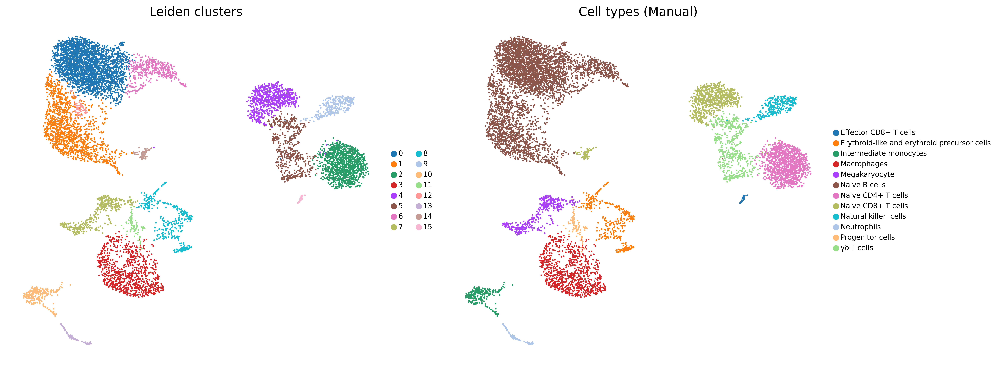

In [11]:
# UMAP comparison: clusters vs annotations
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sc.pl.umap(adata, color=CLUSTER_KEY, legend_loc='right margin',
           title='Leiden clusters', ax=axes[0], show=False, frameon=False,
           legend_fontsize=8)

sc.pl.umap(adata, color='cell_type_manual', legend_loc='right margin',
           title='Cell types (Manual)', ax=axes[1], show=False, frameon=False,
           legend_fontsize=8)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'umap_manual_annotations.png'), dpi=300, bbox_inches='tight')
plt.show()


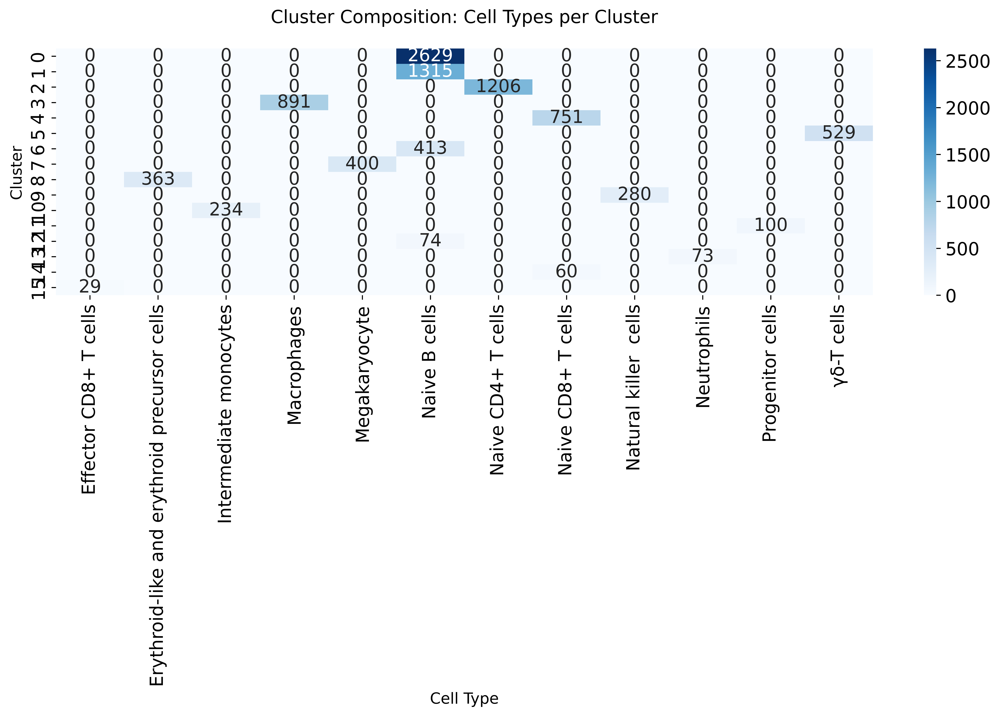

In [12]:
# Cluster composition heatmap
cluster_celltype = pd.crosstab(adata.obs[CLUSTER_KEY], adata.obs['cell_type_manual'])
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(cluster_celltype, annot=True, fmt='d', cmap='Blues', ax=ax)
ax.set_title('Cluster Composition: Cell Types per Cluster', fontsize=14, pad=20)
ax.set_xlabel('Cell Type', fontsize=12)
ax.set_ylabel('Cluster', fontsize=12)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'cluster_composition_manual.png'), dpi=300, bbox_inches='tight')
plt.show()


## Step 7: Save Results


In [ ]:
# Save cluster to cell type mapping
mapping_df = pd.DataFrame({
    'cluster': list(manual_annotations.keys()),
    'cell_type': list(manual_annotations.values())
})
mapping_file = os.path.join(OUTPUT_DIR, 'cluster_to_celltype_manual.csv')
mapping_df.to_csv(mapping_file, index=False)
print(f"✓ Saved: {mapping_file}")

# Save scores
scores_file = os.path.join(OUTPUT_DIR, 'sctypedb_scores_per_cluster.csv')
scores_df.to_csv(scores_file)
print(f"✓ Saved: {scores_file}")

# Save annotated AnnData
output_file = os.path.join(OUTPUT_DIR, 'annotated_manual_sctypedb.h5ad')
adata.write(output_file)
print(f"✓ Saved: {output_file}")

print("\n✅ Manual annotation complete!")
